# Heart Disease

# Loading Data
View data to determine the Class Label and its location

In [ ]:
import pandas as pd
from scipy import stats
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import LabelEncoder


data = pd.read_csv('Preprocessed_dataset.csv');
print(data)

             Age  Sex  ChestPainType RestingBP Cholesterol  FastingBS  \
0          Young    1              1    Normal        High          0   
1          Young    0              2      High         Low          0   
2          Young    1              1       Low        High          0   
3          Young    0              0    Normal    Moderate          0   
4    Middle-Aged    1              2      High         Low          0   
..           ...  ...            ...       ...         ...        ...   
913        Young    1              3  Very Low        High          0   
914          Old    1              0      High         Low          1   
915  Middle-Aged    1              0       Low         Low          0   
916  Middle-Aged    0              1       Low    Moderate          0   
917        Young    1              2    Normal         Low          0   

        MaxHR  ExerciseAngina            Oldpeak  ST_Slope  HeartDisease  
0        High               0      No Depression

# Encoding:
Since our dataset includes categorical columns, and scikit-learn only accepts numerical data, we'll need to encode these categorical features.

In [ ]:
data = pd.read_csv('Preprocessed_dataset.csv')

# Initialize the LabelEncoder
le = LabelEncoder()

# List of categorical columns you want to encode (adjust this based on your dataset)
categorical_cols = ['Age', 'Cholesterol', 'RestingBP', 'MaxHR', 'Oldpeak']  # Update based on your dataset's column names

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    if col in data.columns:
        data[col] = le.fit_transform(data[col])
    else:
        print(f"Column '{col}' not found in the dataset!")

# Save the encoded dataset to a CSV file
data.to_csv('Encoded_Preprocessed_dataset.csv', index=False)
print(data)

     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0                 0        1         2             0  
1

# Feature Selection
chooses the variables (features) to be utilized in training, which are kept in the variable "X," as well as the variable from the dataset that has the right classifications (class labels), which is kept in the variable "y."

In [ ]:
fn= data.keys().tolist()[:-1]
X= data[fn]
y=data['HeartDisease']
print(X)

     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  
0                 0        1         2  
1                 0        0 

# Data Mining Technique

# Classification

## Information Gain (Entropy):

### Splitting Data into: 70% Training and 30% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

**Confusion matrix:**

[[ 83  26]
 [ 42 125]]


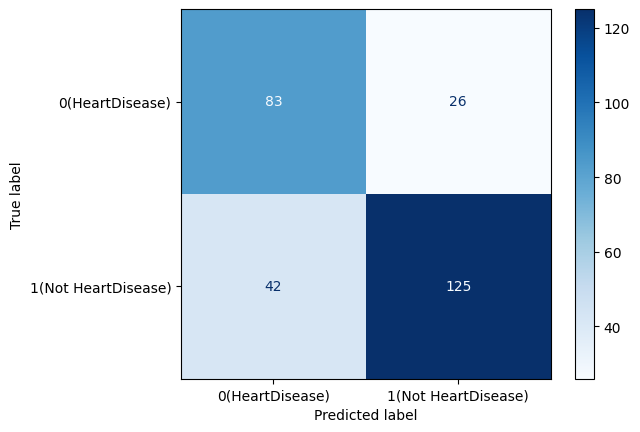

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


cm = confusion_matrix(y_test, y_pred)
print(cm)


cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 2x2 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:

-Top-Left (TP) = 83 Correctly predicted as "HeartDisease" when the actual label was "HeartDisease."

-Top-Right (FN) = 26 Incorrectly predicted as "Not HeartDisease" when the actual label was "HeartDisease."

-Bottom-Left (FP) = 42 Incorrectly predicted as "HeartDisease" when the actual label was "Not HeartDisease."

-Bottom-Right (TN) = 125 Correctly predicted as "Not HeartDisease" when the actual label was "Not HeartDisease."

- insight:

The model:

 correctly identified 83 cases of HeartDisease and 125 cases of Not HeartDisease.

It incorrectly classified 26 cases of HeartDisease as Not HeartDisease and 42 cases of Not HeartDisease as HeartDisease.

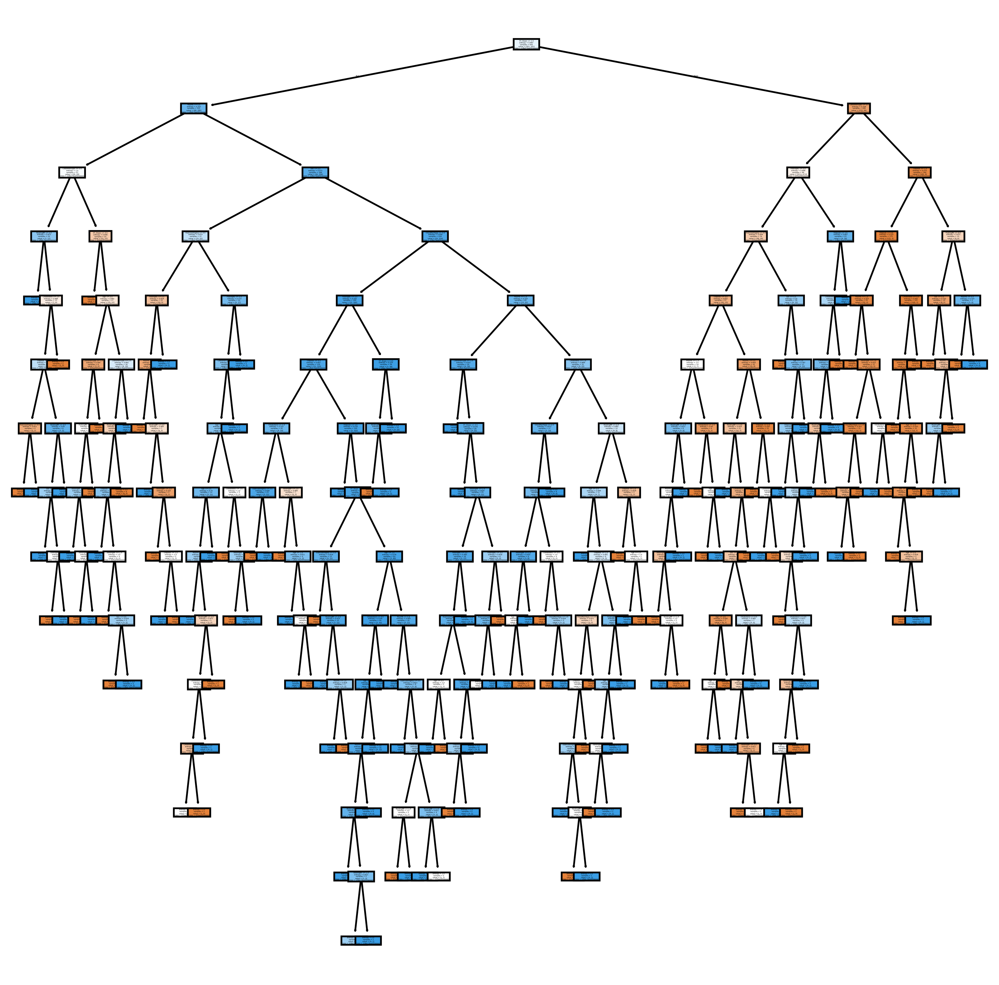

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0(HeartDisease)' , 1:'1(Not HeartDisease)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()


The decision tree shows a classification process to predict heart disease based on various features. The tree split based on an attribute that provides the highest information gain or the best separation of the classes.

Initial Splits: The first node represents the feature deemed most important for dividing the samples, chosen by its impact on reducing entropy or impurity in the dataset. For instance, a feature with a high relevance to heart disease risk factors, such as age or cholesterol level, may be the initial split.

Subsequent Nodes: As we move down the tree, additional branches appear, showing further splits on other features. Attributes such as age, resting heart rate, and glucose levels play significant roles in this structure. Each of these features introduces additional splits, refining the classification based on their respective thresholds, suggesting their influence in distinguishing between samples that indicate heart disease and those that do not.

Leaf Nodes: At the leaf nodes, the tree provides the final predictions: "Heart Disease" or "Not Heart Disease." Each leaf represents a unique path defined by specific combinations of feature values encountered at each branching point along the way. These leaf nodes act as the endpoints of classification, where the samples are conclusively assigned a class based on the path followed.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm2 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm2)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm2[1, 1]
TN = cm2[0, 0]
FP = cm2[0, 1]
FN = cm2[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[ 83  26]
 [ 42 125]]
Accuracy: 0.7536231884057971
Error Rate: 0.24637681159420288
Sensitivity: 0.7485029940119761
Specificity: 0.7614678899082569
Precision: 0.8278145695364238




-**Accuracy**: This metric measures the proportion of all correct predictions. Here, the model's accuracy is approximately 75.36%, meaning it correctly classifies about 75% of instances.
  
-**Error Rate**: This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 24.64%.
  
-**Sensitivity (Recall)**: This indicates the proportion of actual positive cases (heart disease) that the model correctly identifies. In this case, the sensitivity is approximately 74.85%.
  
-**Specificity**: This measures the proportion of actual negative cases (no heart disease) that the model correctly identifies, which is around 76.15%.
  
-**Precision**: This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 82.78%.

**Outcomes**:

- The model’s accuracy of 75.36% shows a reasonable level of correct predictions overall.
- The sensitivity (74.85%) indicates that the model has a strong ability to identify cases of heart disease.
- Specificity, at 76.15%, reflects the model’s competence in correctly classifying negative cases (no heart disease).
- Precision at 82.78% highlights the accuracy of positive predictions, suggesting that most positive predictions made by the model are correct.



### Splitting Data into: 60% Training and 40% Test:





In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf3 = DecisionTreeClassifier(criterion='entropy')

clf3 = clf3.fit(X_train, y_train)

y_pred = clf3.predict(X_test)

**Confusion matrix:**

[[120  33]
 [ 52 163]]


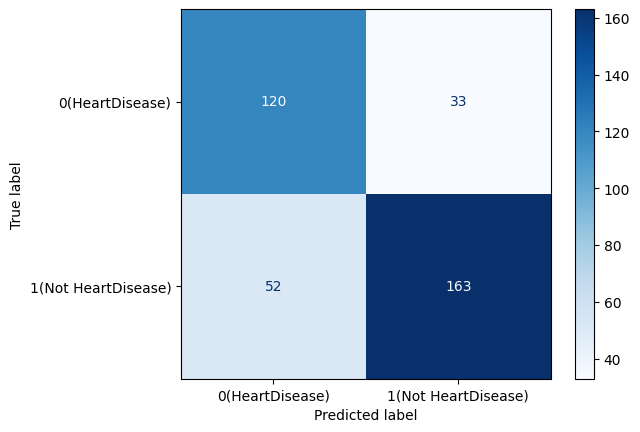

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()



-**Top-Left (TP)** = 120: Correctly predicted as "HeartDisease" when the actual label was "HeartDisease."

-**Top-Right (FN)** = 33: Incorrectly predicted as "Not HeartDisease" when the actual label was "HeartDisease."

-**Bottom-Left (FP)** = 52: Incorrectly predicted as "HeartDisease" when the actual label was "Not HeartDisease."

-**Bottom-Right (TN)** = 163: Correctly predicted as "Not HeartDisease" when the actual label was "Not HeartDisease."


- Insight

The model:

Correctly identified **120 cases of HeartDisease** and **163 cases of Not HeartDisease.**

Incorrectly classified **33 cases of HeartDisease as Not HeartDisease** and **52 cases of Not HeartDisease as HeartDisease.**



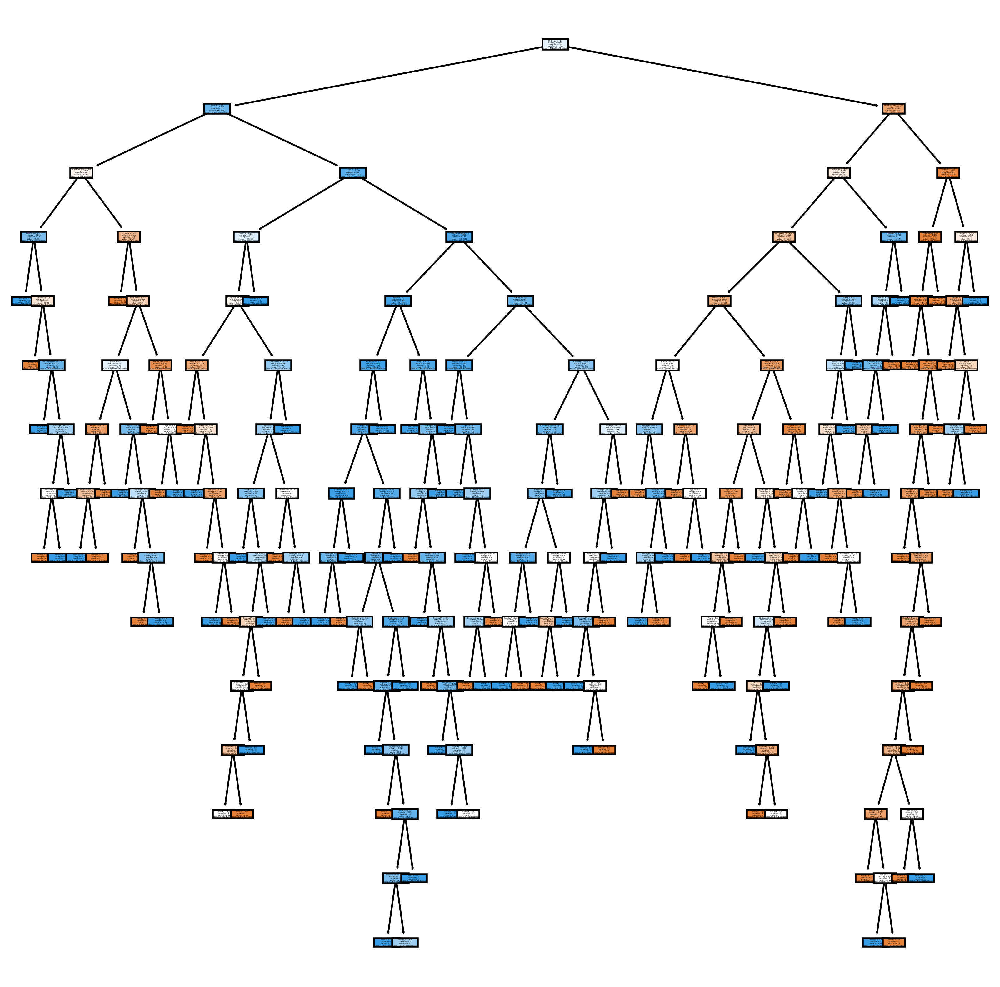

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()


This decision tree displays a hierarchical classification process where nodes split based on selected attributes to optimize prediction accuracy. Each node represents a decision point that utilizes a feature from the dataset, chosen based on its ability to enhance separation between classes by reducing uncertainty (impurity).

-initial Split: The root node at the top represents the feature with the highest discriminative power. This feature is selected to best divide the dataset, maximizing information gain or minimizing impurity. The root feature might be one with significant predictive relevance for the classification goal.

-Intermediate Nodes: Moving down the tree, additional splits occur on other features that further partition the data into subsets, leading to more refined classifications. Each of these splits is determined based on thresholds or values that optimize predictive accuracy. Features such as age, blood pressure, cholesterol, or other pertinent factors could be represented here.

Branching Pathways: Each pathway from a parent node to a child node represents a decision based on the feature at that node, effectively creating a path that defines a unique set of conditions. Each branch represents a specific decision based on the feature and threshold split at each node, narrowing down the classification as we proceed.

Leaf Nodes: At the end of each branch, a leaf node provides a final prediction or classification based on the pathway conditions. These leaf nodes represent terminal points where the samples are classified into distinct categories (e.g., "Heart Disease" or "No Heart Disease"). Each pathway to a leaf node represents a unique combination of feature values, guiding the prediction for a specific class based on the model's learned patterns.



In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[120  33]
 [ 52 163]]
Accuracy: 0.7690217391304348
Error Rate: 0.2309782608695652
Sensitivity: 0.7581395348837209
Specificity: 0.7843137254901961
Precision: 0.8316326530612245


-**Accuracy**: This metric measures the proportion of correct predictions among all predictions. Here, the model's accuracy is approximately 76.90%, meaning it correctly classifies about 77% of instances.

-**Error Rate**: This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 23.10%.

-**Sensitivity (Recall)**: This indicates the proportion of actual positive cases (heart disease) that the model correctly identifies. In this case, the sensitivity is approximately 75.81%.

-**Specificity**: This measures the proportion of actual negative cases (no heart disease) that the model correctly identifies, which is around 78.43%.

-**Precision**: This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 83.16%.

**Outcomes**:

- The model’s accuracy of 76.90% demonstrates a reasonable level of correct predictions overall.
- The sensitivity (75.81%) indicates that the model has a good ability to identify cases of heart disease.
- Specificity, at 78.43%, reflects the model’s competence in correctly classifying negative cases (no heart disease).
- Precision at 83.16% highlights the accuracy of positive predictions, suggesting that most positive predictions made by the model are correct.

### Splitting Data into: 80% Training and 20% *Test*


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf3 = DecisionTreeClassifier(criterion='entropy')

clf3 = clf3.fit(X_train, y_train)

y_pred = clf3.predict(X_test)

**Confusion matrix:**

[[61 13]
 [21 89]]


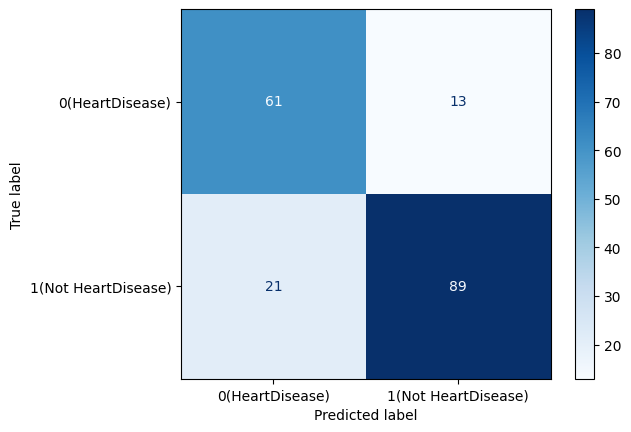

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}


disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()



-**Top-Left (TP) = 61**: Correctly predicted as "HeartDisease" when the actual label was "HeartDisease."

-**Top-Right (FN) = 13**: Incorrectly predicted as "Not HeartDisease" when the actual label was "HeartDisease."

-**Bottom-Left (FP) = 21**: Incorrectly predicted as "HeartDisease" when the actual label was "Not HeartDisease."

-**Bottom-Right (TN) = 89**: Correctly predicted as "Not HeartDisease" when the actual label was "Not HeartDisease."

**Insight**  
The model:

- Correctly identified 61 cases of HeartDisease and 89 cases of Not HeartDisease.
- Incorrectly classified 13 cases of HeartDisease as Not HeartDisease and 21 cases of Not HeartDisease as HeartDisease.

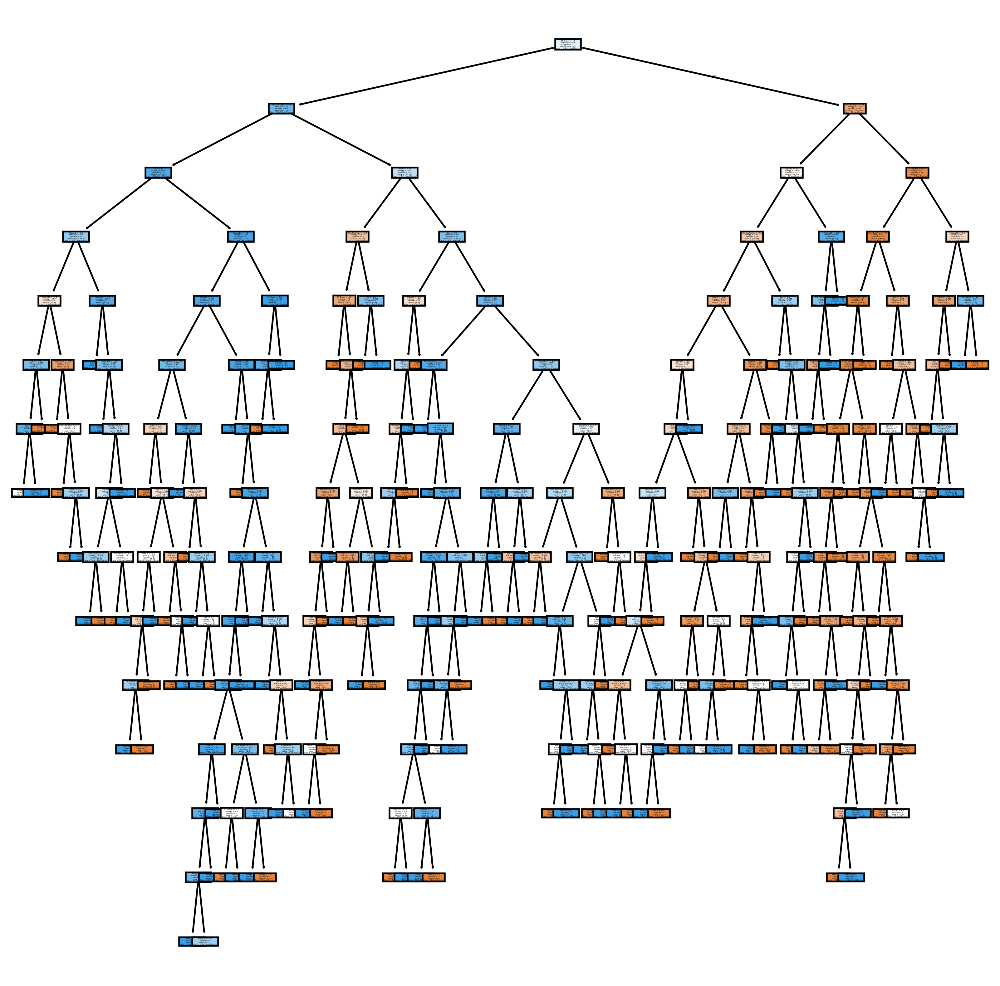

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

The decision tree visualizes a classification model to predict heart disease using various features.

**Initial Split**: The first node represents the feature most important for dividing the data, chosen to maximize information gain, often tied to key heart disease risk factors like age or cholesterol.

**Subsequent Nodes**: Further branches represent splits on additional features like resting heart rate and glucose levels, refining classification with each threshold to distinguish between heart disease and non-heart disease cases.

**Leaf Nodes**: The tree’s leaf nodes give final predictions—“Heart Disease” or “Not Heart Disease”—based on unique paths through specific feature combinations encountered along the way.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[61 13]
 [21 89]]
Accuracy: 0.8152173913043478
Error Rate: 0.18478260869565222
Sensitivity: 0.8090909090909091
Specificity: 0.8243243243243243
Precision: 0.8725490196078431




-Accuracy: This metric measures the proportion of correct predictions among all predictions. Here, the model's accuracy is approximately 81.52%, meaning it correctly classifies about 82% of instances.

-Error Rate: This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 18.48%.

-Sensitivity (Recall): This indicates the proportion of actual positive cases (heart disease) that the model correctly identifies. In this case, the sensitivity is approximately 80.91%.

-Specificity: This measures the proportion of actual negative cases (no heart disease) that the model correctly identifies, which is around 82.43%.

-Precision: This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 87.25%.

**Outcomes**:

- The model’s accuracy of 81.52% demonstrates a strong level of correct predictions overall.

- The sensitivity (**80.91%**) indicates that the model has a good ability to identify cases of heart disease.

- Specificity, at 82.43%, reflects the model’s competence in correctly classifying negative cases (no heart disease).

- Precision at 87.25% highlights the accuracy of positive predictions, suggesting that most positive predictions made by the model are correct.



##Evaluate the models of information gain



### Summary of the Results

| Split         | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|---------------|----------|-------------|-------------|-------------|-----------|
| 70%-30%       | 0.7536   | 0.2464      | 0.7485      | 0.7615      | 0.8278    |
| 60%-40%       | 0.7690   | 0.2310      | 0.7581      | 0.7843      | 0.8316    |
| 80%-20%       | 0.8152   | 0.1848      | 0.8091      | 0.8243      | 0.8725    |

### Evaluation of Models

1. Accuracy:
   - The accuracy increases from 75.36% (70%-30%) to 81.52% (80%-20%).
   - This suggests that a larger training set (80%) leads to a better model performance, likely due to more data for the model to learn from.

2. Error Rate:
   - The error rate decreases as the training set size increases, which aligns with the increase in accuracy.
   - This indicates that the model is making fewer incorrect predictions as the training data increases.

3. Sensitivity (True Positive Rate):
   - Sensitivity also improves from 74.85% to 80.91% as the training data increases.
   - This suggests that the model becomes better at identifying positive cases (true positives) with more training data.

4. Specificity (True Negative Rate):
   - Specificity improves from 76.15% to 82.43% as the training data increases.
   - This indicates that the model is also better at correctly identifying negative cases (true negatives) with more training data.

5. Precision:
   - Precision increases from 82.78% to 87.25%.
   - This means that with more training data, the model is not only better at classifying instances but also reduces the number of false positives.

### Conclusion

From the analysis, it is clear that increasing the training data size leads to improved model performance across all metrics. The model trained on 80% of the data (20% test) shows the best overall performance, indicating that more data can help the model generalize better and make more accurate predictions.



## Gini Index:

### Splitting Data into: 70% Training and 30% Test:



In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf4 = DecisionTreeClassifier(criterion='gini')

clf4 = clf4. fit (X_train, y_train)

y_pred = clf4.predict (X_test)

**Confusion matrix:**

[[ 80  29]
 [ 38 129]]


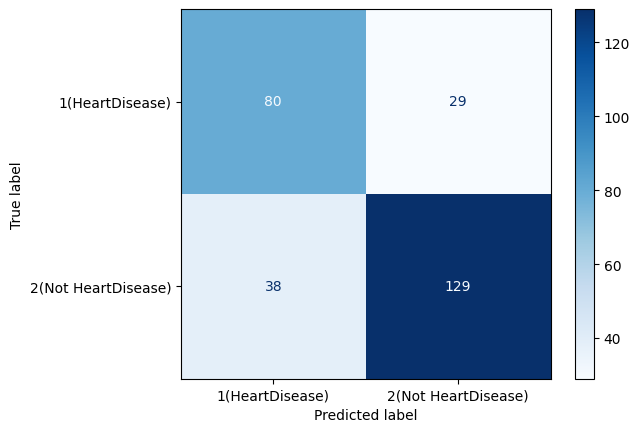

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

The confusion matrix represents the performance measurement of the classification model.

**Interpretation:**
* Top-Left (TP) = 80: Correctly identified instances with heart disease.
* Top-Right (FN) = 29: Actual heart disease cases that were missed (classified as no heart disease).
* Bottom-Left (FP) = 38: Instances without heart disease that were incorrectly classified as having it.
* Bottom-Right (TN) = 129: Correctly identified instances without heart disease.


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

tree.plot_tree(clf4,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

**From the decision tree visualization:**

Initial Split: The first split is determined by the feature that optimally reduces impurity, selected using the Gini index to create the strongest division between classes.

Subsequent Nodes: Additional splits refine the classification further, with each node dividing the data into smaller, more homogenous groups, better distinguishing between heart disease and non-heart disease outcomes.

Leaf Nodes: At the leaf nodes, the model makes its final predictions—either “Heart Disease” or “Not Heart Disease”—based on the distinct paths defined by the preceding splits.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[ 80  29]
 [ 38 129]]
Accuracy: 0.7572463768115942
Error Rate: 0.24275362318840576
Sensitivity: 0.7724550898203593
Specificity: 0.7339449541284404
Precision: 0.8164556962025317


**Model Performance Metrics:**

* Accuracy: The model achieves an accuracy rate of approximately 76%, which indicates that it is generally effective at classifying instances of heart disease and non-heart disease.

* Error Rate: The error rate stands at around 24%, indicating that roughly one in five predictions is incorrect.

* Sensitivity: The model's sensitivity, at approximately 77%, shows that it captures a significant proportion of actual heart disease cases. However, the presence of 29 false negatives suggests that a notable number of patients with heart disease are being missed.

* Specificity: With a specificity of around 73%, the model is relatively effective in correctly identifying patients who do not have heart disease.

* Precision: A precision rate of approximately 82% means that when the model predicts a patient has heart disease, it is correct about two-thirds of the time. While this is satisfactory, there is still potential for improvement.


**Outcomes:**

The model has a good balance between sensitivity and specificity, indicating it can detect heart disease cases effectively while also correctly identifying non-disease cases.
However, the relatively high number of false negatives suggests there’s room for improvement in detecting positive cases.
The high precision rate shows confidence in positive predictions, meaning when it predicts heart disease, it's likely correct.

### Splitting Data into: 60% Training and 40% Test:


In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf5 = DecisionTreeClassifier(criterion='gini')

clf5 = clf5. fit (X_train, y_train)

y_pred = clf5.predict (X_test)

**Confusion matrix:**

[[124  29]
 [ 56 159]]


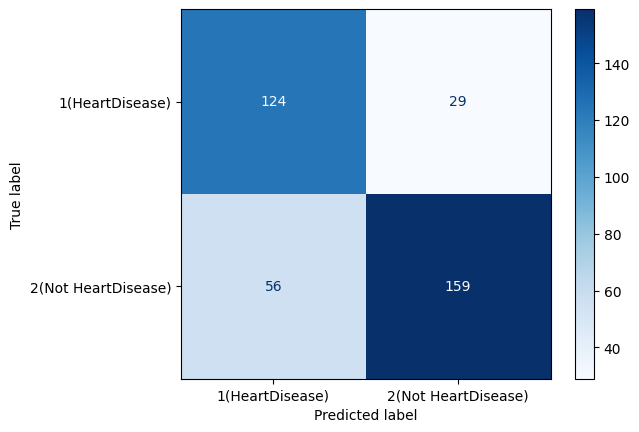

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm5 = confusion_matrix(y_test, y_pred)
print(cm5)


# Assuming you already have cm, y_test, and y_pred computed
cm5 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm5, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

**Confusion matrix interpretation:**
* Top-Left (TP) = 124: Correctly identified instances with heart disease.
* Top-Right (FN) = 29: Actual heart disease cases that were missed.
* Bottom-Left (FP) = 56: Instances without heart disease incorrectly classified as having it.
* Bottom-Right (TN) = 159: Correctly identified instances without heart disease.

In [ ]:
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(Liver Disease)', 2: '2(Not Liver Disease)'}

tree.plot_tree(clf5,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

**From the decision tree visualization:**

Initial Split: The root node uses the feature that provides the greatest reduction in impurity according to the Gini index. This ensures the initial division is as informative as possible, separating the data into two distinct groups right from the start.

Subsequent Nodes: The tree branches into further nodes based on additional features, each split refining the classification by progressively dividing the data into smaller, more homogeneous subsets that distinguish between heart disease and non-heart disease cases.

Leaf Nodes: At the leaf nodes, the tree makes its final predictions. Each leaf represents a specific classification outcome, either “Heart Disease” or “Not Heart Disease,” determined by the sequence of splits encountered along the path.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm5 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm5)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm5[1, 1]
TN = cm5[0, 0]
FP = cm5[0, 1]
FN = cm5[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[124  29]
 [ 56 159]]
Accuracy: 0.7690217391304348
Error Rate: 0.2309782608695652
Sensitivity: 0.7395348837209302
Specificity: 0.8104575163398693
Precision: 0.8457446808510638


**Model Performance:**

* Accuracy: The model shows a strong overall performance, achieving an accuracy of 77%. Indicating that the model is generally effective at distinguishing between heart disease and non-heart disease cases.

* Error Rate: The error rate of approximately 23% reflects the proportion of incorrect predictions. This indicates that one in five cases is misclassified, highlighting areas for potential improvement, especially given the critical nature of medical diagnoses where errors can have significant implications.

* Sensitivity: The model's sensitivity of 74% shows that it effectively identifies true cases of heart disease. This metric is particularly important in medical applications where failing to detect a condition can lead to adverse outcomes.

* Specificity: A specificity of 81% indicates that the model is reasonably effective in correctly identifying patients who do not have heart disease. However, the relatively high number of 56 false positives suggests that some healthy individuals are being incorrectly classified as having the condition.

* Precision: The model's precision stands at approximately 85%, implying that nearly 70% of patients predicted to have heart disease actually do.


**Overall Model Assessment:**

The model strikes a reasonable balance between sensitivity and specificity, which is critical in healthcare scenarios where both missed diagnoses and false positives have significant implications. However, the model's complexity, as seen in the decision tree's depth, may indicate potential overfitting. Simplifying the tree or applying regularization techniques could enhance its generalization capability to new, unseen data.


### Splitting Data into: 80% Training and 20% Test:








In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf6 = DecisionTreeClassifier(criterion='gini')

clf6 = clf6. fit (X_train, y_train)

y_pred = clf6.predict (X_test)

**Confusion matrix:**

[[62 12]
 [22 88]]


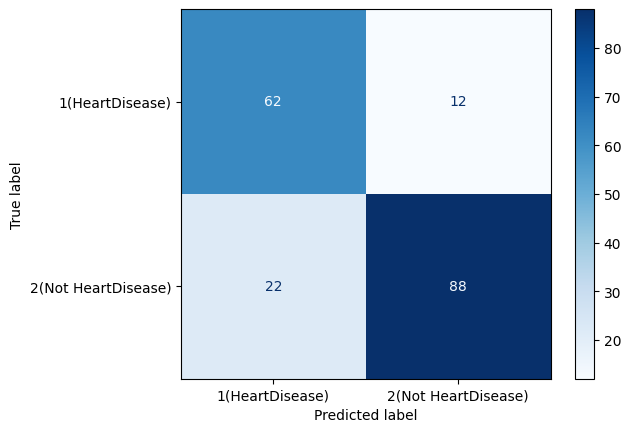

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm6 = confusion_matrix(y_test, y_pred)
print(cm6)
cm6 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Confusion matrix interpretation:
* Top-Left (TP) = 62: Correctly predicted heart disease cases.
* Top-Right (FN) = 12: Actual heart disease cases that were missed.
* Bottom-Left (FP) = 22: Healthy patients incorrectly classified as having heart disease.
* Bottom-Right (TN) = 88: Correctly identified non-heart disease cases.

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

tree.plot_tree(clf6,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

**From the decision tree visualization:**

Initial Split: The decision tree starts with a feature that maximizes the separation of classes using the Gini index, ensuring the strongest possible division right at the outset.

Subsequent Nodes: As the tree branches further, additional features are used to progressively split the data, refining the classification by creating smaller and more homogenous groups that differentiate between heart disease and non-heart disease instances.

Leaf Nodes: At the terminal nodes, the model makes its final predictions of either “Heart Disease” or “Not Heart Disease” based on the specific path taken through the tree, guided by the sequence of feature splits encountered along the way.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm6 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm6)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm6[1, 1]
TN = cm6[0, 0]
FP = cm6[0, 1]
FN = cm6[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[62 12]
 [22 88]]
Accuracy: 0.8152173913043478
Error Rate: 0.18478260869565222
Sensitivity: 0.8
Specificity: 0.8378378378378378
Precision: 0.88


**Model Performance:**
* Accuracy: The model demonstrates a high accuracy rate of approximately 82%, indicating that it reliably distinguishes between heart disease and non-heart disease cases. This high accuracy suggests that the model is effectively learning patterns from the training data and applying them to new, unseen cases.

* Error Rate: The error rate of around 18% reflects that a small proportion of predictions are incorrect.

* Sensitivity: The sensitivity rate of 80% indicates that the model is quite effective at identifying true heart disease cases.

* Specificity: The model achieves a specificity rate of approximately 84%, reflecting its ability to correctly classify non-heart disease cases.

* Precision: A precision rate of around 88% implies that when the model predicts heart disease, it is correct nearly three-quarters of the time. This level of precision is satisfactory, though there remains room for improvement.

**Overall Model Assessment:**

The model shows a strong balance between sensitivity and specificity, making it a reliable tool for detecting heart disease.
The 80-20 split has demonstrated the highest overall performance among the different splits tested, with the highest accuracy (82%) and a strong sensitivity rate (80%). These metrics indicate that this model is particularly effective at identifying patients with heart disease, which is crucial for minimizing missed diagnoses in clinical settings.



##Evaluate the models of Gini Index:




### Summary of Results

| Split         | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|---------------|----------|-------------|-------------|-------------|-----------|
| 70%-30%       | 0.7572   | 0.2428      | 0.7725      | 0.7339      | 0.8165    |
| 60%-40%       | 0.7690   | 0.2310      | 0.7395      | 0.8105      | 0.8457    |
| 80%-20%       | 0.8152   | 0.1848      | 0.8000      | 0.8378      | 0.8800    |

### Evaluation of Models

1. Accuracy
   -  The accuracy improves from 75.72% (70%-30%) to 81.52% (80%-20%). Higher accuracy indicates better overall model performance.

2.  Error Rate:
 - The error rate decreases from 24.28% to 18.48%, which is a positive trend indicating fewer misclassifications with larger training sets.

3. Sensitivity:
   - Sensitivity varies, with values of 77.25%, 73.95%, and 80.00% for the three splits. The increase in sensitivity in the 80%-20% split suggests a better ability to correctly identify positive cases.

4. Specificity:
   - Specificity shows variability across splits: 73.39% (70%-30%), 81.05% (60%-40%), and 83.78% (80%-20%). Higher specificity in the 80%-20% split indicates improved correct identification of negative cases.

5.  Precision:
   - Precision increases from 81.65% (70%-30%) to 88.00% (80%-20%). This indicates that with more training data, the model becomes better at predicting true positives with fewer false positives.


### Conclusion



- The model with an 80%-20% split is the most effective, exhibiting the best overall performance metrics. This implies a potentially higher Gini Index, indicating better discriminatory power between classes.
- The 60%-40% split provides a balanced performance, while the 70%-30% split shows the lowest performance across all metrics.

In summary, as the training size increases, the model's ability to distinguish between classes improves, likely resulting in a higher Gini Index and better performance in a practical application.

##The best model between information gain and the Gini index:




### Comparison of Models

#### Information Gain Results
- 70%-30% Split:
  - Accuracy: 0.7536
  - Error Rate: 0.2464
  - Sensitivity: 0.7485
  - Specificity: 0.7615
  - Precision: 0.8278

- 60%-40% Split:
  - Accuracy: 0.7690
  - Error Rate: 0.2310
  - Sensitivity: 0.7581
  - Specificity: 0.7843
  - Precision: 0.8316

- 80%-20% Split:
  - Accuracy: 0.8152
  - Error Rate: 0.1848
  - Sensitivity: 0.8091
  - Specificity: 0.8243
  - Precision: 0.8725

#### Gini Index Results
- 70%-30% Split:
  - Accuracy: 0.7572
  - Error Rate: 0.2428
  - Sensitivity: 0.7725
  - Specificity: 0.7339
  - Precision: 0.8165

- 60%-40% Split:
  - Accuracy: 0.7690
  - Error Rate: 0.2310
  - Sensitivity: 0.7395
  - Specificity: 0.8105
  - Precision: 0.8457

- 80%-20% Split:
  - Accuracy: 0.8152
  - Error Rate: 0.1848
  - Sensitivity: 0.8000
  - Specificity: 0.8378
  - Precision: 0.8800

### Analysis of Results

1. Accuracy:
   - Both models achieve the same highest accuracy of 81.52% with the 80%-20% split.
   
2. Error Rate:
   - Both models show the same lowest error rate of 18.48% with the 80%-20% split.

3. Sensitivity:
   - Information Gain has a slightly higher sensitivity at 80.91%, compared to 80.00% for the Gini Index in the 80%-20% split. This suggests the Information Gain model is better at identifying true positives.

4. Specificity:
   - The Gini Index model shows higher specificity (**83.78%**) compared to Information Gain (**82.43%**) at the same split. This indicates Gini Index is better at identifying true negatives.

5. Precision:
   - The Gini Index model edges out with a higher precision of 88.00% compared to 87.25% for Information Gain, suggesting it has fewer false positives.

### Conclusion

Both models perform similarly well at the 80%-20% split, but they excel in different areas:

- Information Gain has better sensitivity, meaning it is better at identifying positive cases.
- Gini Index demonstrates better specificity and precision, indicating it is more effective at identifying negative cases and has fewer false positives.

Final analysis:
If the priority is to identify as many true positives as possible, the Information Gain model may be preferable. However, if minimizing false positives and maximizing overall precision is the goal, the Gini Index model is the better choice.



# Clustering

##Preparing For Clustering

Since the discretized columns (Age, RestingBP, Cholesterol, MaxHR, Oldpeak) are categorical but represent ordered groups, we need to convert them into numeric values. This can be done using Label Encoding to assign numerical values to each category:

**Age**: Convert the categories Young, Middle-Aged, and Old into numeric values

(e.g., Young=0, Middle-Aged=1, Old=2).

**RestingBP**: Convert the categories Very Low, Low, Normal, and High into numeric values

(e.g., Very Low=0, Low=1, Normal=2, High=3).

**Cholesterol**: Convert the categories Low, Moderate, and High into numeric values

(e.g., Low=0, Moderate=1, High=2).

**MaxHR**: Convert the categories Low, Moderate, and High into numeric values

(e.g., Low=0, Moderate=1, High=2).

**Oldpeak**: Convert the categories No Depression, Mild Depression, and Severe Depression into numeric values

(e.g., No Depression=0, Mild Depression=1, Severe Depression=2).


In [ ]:
import pandas as pd

# Load the preprocessed dataset
data = pd.read_csv('Preprocessed_dataset.csv')

# Define the ordered mappings for each feature
ordered_mappings = {
    'Age': {'Young': 0, 'Middle-Aged': 1, 'Old': 2},
    'RestingBP': {'Very Low': 0, 'Low': 1, 'Normal': 2, 'High': 3},
    'Cholesterol': {'Low': 0, 'Moderate': 1, 'High': 2},
    'MaxHR': {'Low': 0, 'Moderate': 1, 'High': 2},
    'Oldpeak': {'No Depression': 0, 'Mild Depression': 1, 'Severe Depression': 2}
}

# Apply the custom encoding based on defined mappings
for col, mapping in ordered_mappings.items():
    if col in data.columns:
        data[col] = data[col].map(mapping)

# Save the encoded dataset
data.to_csv('Encoded2_data.csv', index=False)

# Display the first few rows of the encoded dataset
print("Data after Custom Ordered Encoding:")
print(data.head())



Data after Custom Ordered Encoding:
   Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0    0    1              1          2            2          0      2   
1    0    0              2          3            0          0      2   
2    0    1              1          1            2          0      0   
3    0    0              0          2            1          0      0   
4    1    1              2          3            0          0      0   

   ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0               0        0         2             0  
1               0        1         1             1  
2               0        0         2             0  
3               1        2         1             1  
4               0        0         2             0  


##Scaling Data

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler


data = pd.read_csv('Encoded2_data.csv')

# Extract the features (excluding 'HeartDisease' column, which is the target)
features = data.drop('HeartDisease', axis=1)

# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Create a new DataFrame with the scaled features
scaled_data = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
print(scaled_data.head())  # Display the first few rows of the scaled data


scaled_data.to_csv('Scaled_dataset.csv', index=False)



Scaled DataFrame:
        Age       Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  \
0 -1.196072  0.515952       0.229032   0.529852     1.228094  -0.551341   
1 -1.196072 -1.938163       1.275059   1.389223    -1.217438  -0.551341   
2 -1.196072  0.515952       0.229032  -0.329519     1.228094  -0.551341   
3 -1.196072 -1.938163      -0.816995   0.529852     0.005328  -0.551341   
4  0.037629  0.515952       1.275059   1.389223    -1.217438  -0.551341   

      MaxHR  ExerciseAngina   Oldpeak  ST_Slope  
0  1.298871       -0.823556 -1.064196  1.052114  
1  1.298871       -0.823556  0.102987 -0.596078  
2 -1.177482       -0.823556 -1.064196  1.052114  
3 -1.177482        1.214246  1.270169 -0.596078  
4 -1.177482       -0.823556 -1.064196  1.052114  


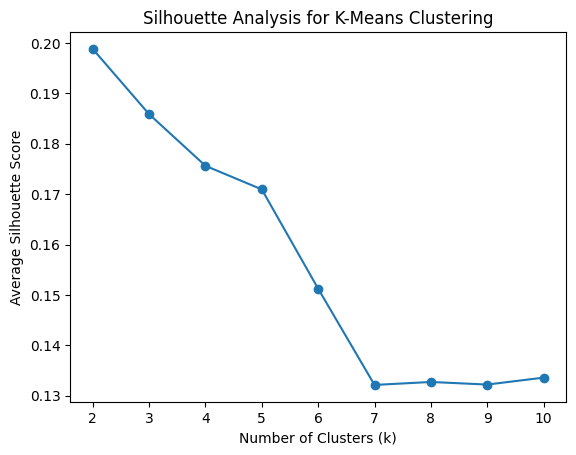

The highest average Silhouette score is 0.1987971874978167 with k=2.
The second highest average Silhouette score is 0.18586553124066024 with k=3.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Perform k-means clustering with different values of k (from 2 to 10)
k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_result = kmeans.fit_predict(scaled_data)  # Use your scaled dataset here
    silhouette_avg = silhouette_score(scaled_data, kmeans_result)  # Calculate silhouette score
    silhouette_avg_values.append(silhouette_avg)

# Find the best number of clusters based on the highest average Silhouette score
best_k = k_values[np.argmax(silhouette_avg_values)]
best_score = max(silhouette_avg_values)

# Find the second highest average Silhouette score and its corresponding number of clusters
silhouette_avg_values_sorted = sorted(silhouette_avg_values, reverse=True)
second_best_score = silhouette_avg_values_sorted[1]
second_best_k = k_values[silhouette_avg_values.index(second_best_score)]

# Plot the silhouette scores for different values of k
plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

# Print the best and second best k values based on silhouette score
print(f"The highest average Silhouette score is {best_score} with k={best_k}.")
print(f"The second highest average Silhouette score is {second_best_score} with k={second_best_k}.")

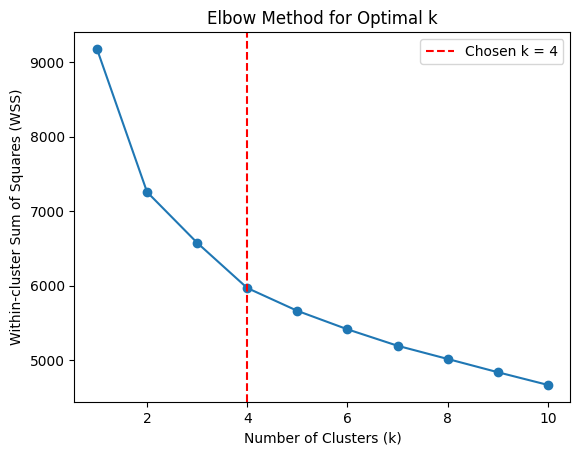

In [ ]:
!pip install kneed
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from kneed import KneeLocator

# Use your pre-scaled dataset
X = scaled_data

# Perform k-means clustering for different values of k (1 to 10)
wss_values = []
k_values = range(1, 11)

# Loop to calculate WSS (Within-Cluster Sum of Squares) for each k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X)  # Use the scaled data
    wss_values.append(kmeans.inertia_)  # Inertia is the WSS

# Plot the elbow method
plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')

# Use KneeLocator to locate the turning point (elbow)
knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
turning_point = knee.elbow

# Highlight the turning point on the plot
plt.axvline(x=turning_point, linestyle='--', color='red', label=f'Chosen k = {turning_point}')
plt.legend()
plt.show()

##**K2**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=2
kmeans = KMeans(n_clusters=2, random_state=8953, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(scaled_data)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[-0.40765583 -0.23435045  0.41114292 -0.24011546  0.08840335 -0.2450333
   0.55491402 -0.68510688 -0.55866455  0.61819491]
 [ 0.4295434   0.24693303 -0.4332177   0.25300757 -0.09314983  0.25818945
  -0.58470806  0.72189114  0.58865996 -0.65138658]]

Cluster Labels:
[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1
 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 1 0 0 0 0 0 0 0 1 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1
 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0
 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0
 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 1 1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 

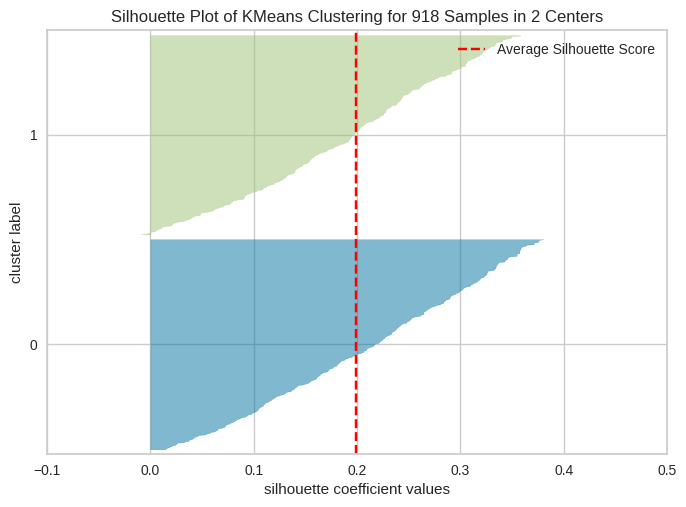

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(scaled_data)
visualizer.show()

From the graph of KMeans Clustering for 918 Samples in 2 Centers, the fact that most of the silhouette scores have a positive value suggests that the samples are reasonably well-matched to their clusters, with a fair distance from neighboring clusters. This indicates that the clustering solution has somewhat separated the data points into two groups, although not with very strong separation.

However, while positive silhouette scores are generally a positive indicator, the relatively low average silhouette score (around 0.1988) shows that the clustering is not "perfect" or entirely clear-cut. There is likely some overlap or ambiguity between clusters, particularly with samples in one center showing scores close to zero or even negative values, indicating potential boundary confusion.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X_scaled = scaled_data

# Perform k-means clustering with k=2
kmeans = KMeans(n_clusters=2, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 7257.779111957767
Average Silhouette Score: 0.1987971874978167


The analysis of the K=2 results is as follows:

WSS: 7257.779 – The high WSS value suggests poor cluster separation and indicates that the clusters are not compact.
Average Silhouette Score: 0.199 – The low score indicates that the clusters are not well-defined and may have ambiguity.

##**K3**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=3
kmeans = KMeans(n_clusters=3, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(scaled_data)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[ 0.41948926  0.34065844  0.14435368 -0.06761564 -0.76326775  0.6537333
  -0.2930698  -0.71681427 -0.1248918   0.01610745]
 [ 0.31801597  0.23707564 -0.52874319  0.28082965  0.07827706  0.05337167
  -0.60060391  1.08688343  0.6832621  -0.67099594]
 [-0.56189428 -0.43536207  0.4376498  -0.23778862  0.37284467 -0.43840118
   0.76673381 -0.65183138 -0.60191286  0.65395508]]

Cluster Labels:
[2 2 2 1 0 2 2 2 1 2 2 1 2 1 2 2 2 2 0 2 2 0 2 1 2 2 1 2 2 0 2 0 1 0 2 2 1
 2 2 1 2 2 2 2 1 1 2 2 2 2 1 1 0 2 1 2 1 2 2 1 2 2 2 1 2 2 2 2 1 2 1 2 0 2
 1 0 2 2 0 2 2 2 0 2 1 1 1 1 2 1 2 2 2 1 2 1 2 0 0 2 1 0 2 1 0 0 2 2 2 2 0
 1 1 2 2 1 2 1 2 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 1 2 2 2 1 1 1 1 1 2 2 2 2 2
 2 1 2 0 2 2 2 1 1 2 1 0 1 1 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 2 2 2 1 2 1 1 2
 0 2 1 1 1 2 2 2 0 2 0 2 2 1 2 2 2 2 2 0 2 2 2 2 0 0 2 2 2 1 2 2 2 0 2 0 1
 2 2 0 2 2 1 2 2 2 2 2 2 2 2 1 2 1 1 2 1 1 2 1 0 1 1 1 1 2 1 1 2 1 2 2 2 2
 2 2 2 1 0 1 2 1 2 1 2 2 2 1 2 2 0 0 1 1 2 2 1 2 2 2 2 0 0 2 2 2 2

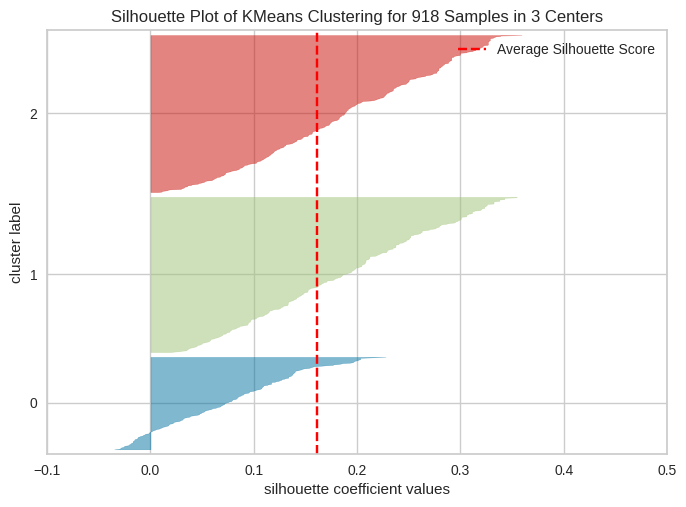

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(scaled_data)
visualizer.show()

From the graph of KMeans Clustering for 918 Samples in 3 Centers, the fact that most silhouette scores have positive values suggests that the samples are fairly well-matched to their clusters and are generally distant from neighboring clusters. This indicates that the clustering solution has separated the data points into reasonably distinct clusters. However, the presence of some silhouette scores close to or below zero implies that there might still be some overlap or ambiguity between clusters, as certain samples may be closer to neighboring clusters than to their assigned ones.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X_scaled = scaled_data

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 6576.072323136901
Average Silhouette Score: 0.18586553124066024


The analysis of the K=3 results is as follows:

WSS: 6576.07 – The relatively high WSS suggests moderate to weak compactness within clusters, indicating that points within clusters are somewhat dispersed.


Average Silhouette Score: 0.186 – This low silhouette score implies some overlap or ambiguity in cluster assignments, suggesting that the clusters are not perfectly distinct.

## **K4**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=6
kmeans = KMeans(n_clusters=4, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(scaled_data)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[-4.42822203e-01  5.15952417e-01  3.63669197e-01 -2.21743331e-01
   1.29242497e-03 -4.26451583e-01  5.10197971e-01 -6.89047889e-01
  -6.21205764e-01  6.22387196e-01]
 [ 3.20628891e-01  2.60865128e-01 -4.87065285e-01  2.12593074e-01
   3.16239969e-02 -5.51341340e-01 -6.44932572e-01  9.51303834e-01
   6.84486231e-01 -6.55153108e-01]
 [-2.70796156e-01 -1.93816322e+00  4.76775296e-01 -2.22097857e-01
   3.27108456e-01 -3.33503203e-01  5.82032428e-01 -6.76083756e-01
  -4.57568072e-01  5.75005614e-01]
 [ 4.66742840e-01  3.55901397e-01 -2.54186941e-01  2.26269760e-01
  -3.20299920e-01  1.81375843e+00 -3.43058297e-01  2.50719954e-01
   3.63065408e-01 -5.06502480e-01]]

Cluster Labels:
[0 2 0 1 0 0 2 0 1 2 2 1 0 1 2 2 0 2 1 0 2 0 2 1 0 0 1 0 2 0 0 0 1 1 2 0 3
 2 2 1 2 2 0 0 1 1 0 0 0 0 1 1 0 2 1 2 1 0 0 1 0 2 0 1 2 2 2 0 1 0 1 0 0 2
 1 0 0 2 0 0 0 0 1 0 3 1 3 1 0 1 2 0 2 1 2 1 0 0 0 0 1 0 2 3 0 0 2 0 0 0 2
 1 3 0 2 2 0 3 2 0 2 2 0 1 0 0 2 2 2 1 0 1 1 1 1 0 2 0 1 1 1 1 1 0 2 0 0

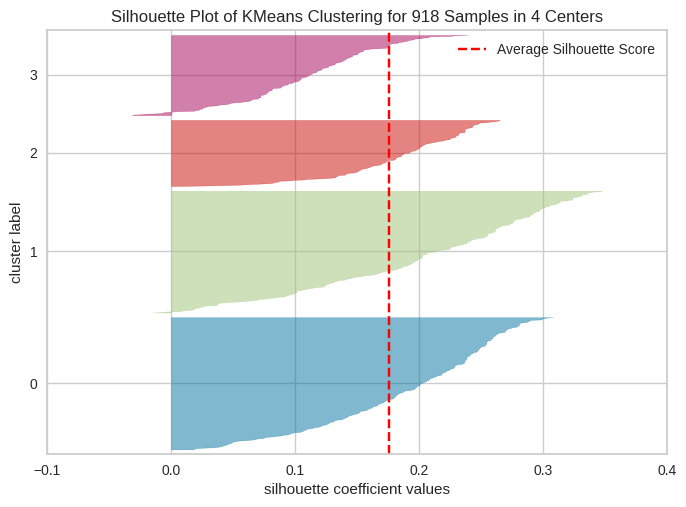

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(scaled_data)
visualizer.show()

From the graph of KMeans Clustering for 918 samples in 4 centers, we observe that most silhouette scores are positive, indicating that samples are generally well-matched to their clusters with some degree of separation from neighboring clusters. The average silhouette score, however, is approximately 0.2, which is relatively low and suggests limited separation between clusters.

While positive silhouette scores are generally a good sign, this clustering solution is not entirely flawless. The presence of some samples with silhouette scores close to 0, and a few with negative values, indicates that certain data points may be near the boundaries between clusters, leading to some overlap and ambiguity in cluster assignments.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X_scaled = scaled_data

# Perform k-means clustering with k=2
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 5968.303218123003
Average Silhouette Score: 0.17561137851887332


The analysis of the given results (K=4) is as follows:

- **WSS: 5968.30** – The relatively high WSS value suggests moderate spread within clusters, indicating that the clusters are not very compact.
- **Average Silhouette Score: 0.176** – The low silhouette score points to significant overlap or ambiguity in the cluster assignments, suggesting that some data points may be close to boundaries between clusters.

Final Choice:
𝐾
=
2
is the optimal choice for the clustering model based on the analyzed metrics (WSS, Average Silhouette Score). This selection is justified as
𝐾
=
2
 provides the highest silhouette score and maintains reasonable WSS compared to
𝐾
=
3
 and
𝐾
=
4
, indicating clearer and more cohesive clusters.